In [ ]:
!pip install easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 55.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 912.2/912.2 kB 48.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.8/286.8 kB 21.2 MB/s eta 0:00:00


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 879.0/879.0 kB 38.8 MB/s eta 0:00:00


In [ ]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.7 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from roboflow import Roboflow
import os

# custom_folder = '/content/drive/MyDrive/Parcial_redes/placas_yolo/dataset'
# # Create the directory if it doesn't exist
# os.makedirs(custom_folder, exist_ok=True)


rf = Roboflow(api_key="1JyiLkbtwZmSoXCqXEnc")
project = rf.workspace("grupo-6-placas").project("peru-plate-numbers")
version = project.version(3)
dataset = version.download("yolov11")
# # Verify the files were downloaded
# print("Files in the directory:")
# print(os.listdir(custom_folder))

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Peru-Plate-Numbers-3 in yolov11:: 100%|██████████| 3292/3292 [00:05<00:00, 654.72it/s] 


In [ ]:
from ultralytics import YOLO
import os

# Load a model
model = YOLO("yolo11n.pt")

cwd = os.getcwd()
rel_path = r"/content/Peru-Plate-Numbers-3/data.yaml"
# Train the model
train_results = model.train(
    data= os.path.join(cwd,rel_path),  # path to dataset YAML Peru-Plate-Numbers-3\data.yaml
    batch=-1,
    epochs=100,  # number of training epochs
    imgsz=640,  # training image size
    device=0,  # device to run on, i.e. device=0 or device=0,1,2,3 or device=cpu
)

# Evaluate model performance on the validation set
metrics = model.val()


In [ ]:

# last_dir = model.trainer.save_dir

# # Mostrar la ubicación del mejor modelo
# best_model_path = os.path.join(last_dir, 'weights', 'best.pt')
# print(f"El modelo final se guardó en: {best_model_path}")

In [ ]:
# !cp {best_model_path} /content/drive/MyDrive/Parcial_redes/placas_yolo/models
#

In [ ]:
from ultralytics import YOLO
import os

# Load model
model = YOLO(r"/content/drive/MyDrive/Parcial_redes/placas_yolo/models/best.pt")
metrics = model.val()

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.26 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 88.4MB/s]
val: Scanning /content/Peru-Plate-Numbers-3/valid/labels... 138 images, 0 backgrounds, 0 corrupt: 100%|██████████| 138/138 [00:00<00:00, 802.10it/s]

val: New cache created: /content/Peru-Plate-Numbers-3/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 240, len(boxes) = 257. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.16it/s]


                   all        138        257      0.902      0.949       0.93      0.687
                 Placa        106        203      0.892      0.946      0.912      0.606
                 placa         32         54      0.911      0.952      0.947      0.768
Speed: 1.2ms preprocess, 4.2ms inference, 0.0ms loss, 8.2ms postprocess per image
Results saved to runs/detect/val


In [ ]:
# # Load model
# model = YOLO(r"runs\detect\train4\weights\best.pt")
# metrics = model.val()


image 1/1 /content/Peru-Plate-Numbers-3/valid/images/20231009_202048_jpg.rf.1a67b5b5f05ba6ea31d332fdfcc9c879.jpg: 480x640 2 placas, 14.5ms
Speed: 3.7ms preprocess, 14.5ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


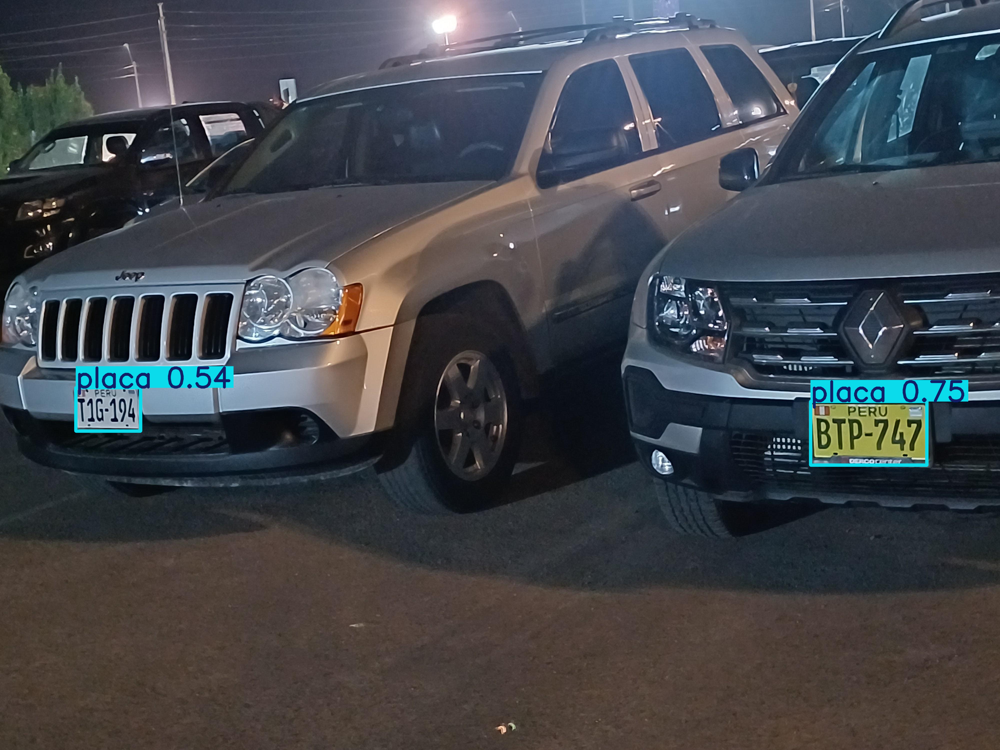

In [78]:
# Perform object detection on an image
results = model(r"/content/Peru-Plate-Numbers-3/valid/images/20231009_202048_jpg.rf.1a67b5b5f05ba6ea31d332fdfcc9c879.jpg")
results[0].show()

In [79]:
# # Perform object detection on an image
# results = model(r"/content/Peru-Plate-Numbers-3/valid/images/Foto-Placa-453-_jpg.rf.74c2435a10f0ac4b5ec258fff82f50dc.jpg")
# results[0].show()

In [80]:
# # Perform object detection on an image
# results = model(r"/content/Peru-Plate-Numbers-3/valid/images/Foto-Placa-505-_jpg.rf.5c1eaaeebfeefb8c38469e7adfd0a0b2.jpg")
# results[0].show()

In [81]:
import cv2
import numpy as np
import easyocr

def crop_image(image_path, bbox):
    # Read the image
    image = cv2.imread(image_path)

    # Get coordinates
    x1, y1, x2, y2 = map(int, bbox)  # Convert to integers

    # Crop the image using numpy array slicing
    cropped_image = image[y1:y2, x1:x2]

    return cropped_image

In [82]:
list_crop_images = []

In [83]:
image_path = results[0].path

In [84]:
for image in boxes.xyxy:
  print(image.tolist())
  # crop_image(image_path,image.tolist())
  list_crop_images.append(crop_image(image_path,image.tolist()))

[3242.521728515625, 1605.609130859375, 3707.03271484375, 1860.48046875]
[303.6209716796875, 1550.8890380859375, 562.27490234375, 1724.2254638671875]


array([[[126, 107,  86],
        [117,  97,  79],
        [113,  96,  77],
        ...,
        [190, 169, 142],
        [185, 164, 136],
        [184, 163, 135]],

       [[122, 102,  84],
        [115,  97,  80],
        [112,  96,  79],
        ...,
        [187, 166, 139],
        [185, 164, 136],
        [184, 163, 135]],

       [[123, 105,  88],
        [120, 104,  88],
        [123, 108,  92],
        ...,
        [193, 172, 145],
        [188, 167, 140],
        [182, 161, 134]],

       ...,

       [[ 15,  12,   8],
        [ 14,  11,   7],
        [ 14,  11,   7],
        ...,
        [ 35,  23,  11],
        [ 28,  18,   8],
        [ 23,  13,   3]],

       [[ 15,  12,   8],
        [ 12,  11,   7],
        [ 12,  11,   7],
        ...,
        [ 21,   9,   0],
        [ 21,  11,   1],
        [ 19,   9,   0]],

       [[ 14,  11,   7],
        [ 12,  11,   7],
        [ 12,  11,   7],
        ...,
        [ 25,  13,   1],
        [ 21,  11,   1],
        [ 21,  11,   1]]], dtype=uint8)
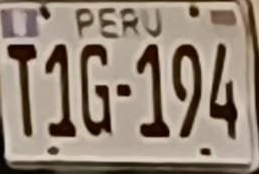

In [85]:
list_crop_images[1]

In [86]:
# Read the image with cv2
# img = cv2.imread('your_image.jpg')

# Initialize EasyOCR reader
# Note: First time will download language models
reader = easyocr.Reader(['en'])  # 'en' for English, you can add more languages like ['en', 'es']

# Get text from image
# Option 1: Directly from the cv2 image
results = reader.readtext(list_crop_images[1])

In [87]:
list_placa_text = []

In [88]:
for image in list_crop_images:
  results = reader.readtext(image)
  for (bbox, text, prob) in results:
    list_placa_text.append(f"Text: {text}")


In [89]:
print(list_placa_text[1],list_placa_text[4])

Text: BTP-747 Text: TJG 194


In [ ]:
best_model_path = "/content/drive/MyDrive/Parcial_redes/placas_yolo/models/best.pt"

In [90]:
from ultralytics import YOLO
import os, shutil

# Cargar el modelo YOLOv11
model = YOLO(best_model_path)

# Directorio donde se encuentran los videos MP4
video_folder = '/content/drive/MyDrive/Parcial_redes/placas_yolo/dataset'

# Procesar todos los archivos MP4 en la carpeta
for video_name in os.listdir(video_folder):
    if video_name.endswith('.mp4'):  # Verificar que sea un archivo MP4
        video_path = os.path.join(video_folder, video_name)

        # Realizar la detección en el video y guardar el resultado
        results = model(video_path, save=True)
        content_rute = 'content/'
        # Guardar la ruta del video procesado
        output_video_path = os.path.join(results[0].save_dir, video_name)

        shutil.copy(output_video_path[:-3]+'avi', os.path.join(content_rute,video_path[:-3]+'avi'))
        # Mostrar la ubicación del video procesado
        print(f"El video procesado se ha guardado en: {output_video_path}")



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1994) /content/drive/MyDrive/Parcial_redes/placas_yolo/dataset/prueba1.mp4: 384x640 (no detections), 10.5ms
video 1/1 (frame 2/1994) /content/drive/MyDrive/Parcial_redes/placas_yolo/dataset/prueba1.mp4: 384x640 (no detections), 9.9ms
video 1/1 (frame 3/1994) /content/drive/MyDrive/Parcial_redes/placas_yolo/dataset/prueba1.mp4: 384x640 (no detections), 9.9ms
video 1/1 (frame 4/1994) /content/drive/MyDrive/Parcial_redes/placas_yolo/dat

In [91]:
video_path[:-3]+'avi'

'/content/drive/MyDrive/Parcial_redes/placas_yolo/dataset/prueba1.avi'